In [7]:
import seaborn as sns
from sklearn.datasets import load_wine
import matplotlib.pyplot as plt

# Load the Wine dataset
wine = load_wine()

X= wine.data
# Convert the dataset to a Pandas dataframe
import pandas as pd
df = pd.DataFrame(wine.data, columns=wine.feature_names)

# Add the 'target' column to the dataframe
df['target'] = wine.target

# Use Seaborn to create a pairplot
# sns.pairplot(df, hue='target', diag_kind='hist')
# plt.show()

K-Means

In [4]:
from sklearn.cluster import KMeans
import numpy as np

kmeans = KMeans(n_clusters=3)

kmeans.fit(X)

labels = kmeans.labels_

print(np.bincount(labels))

[69 47 62]


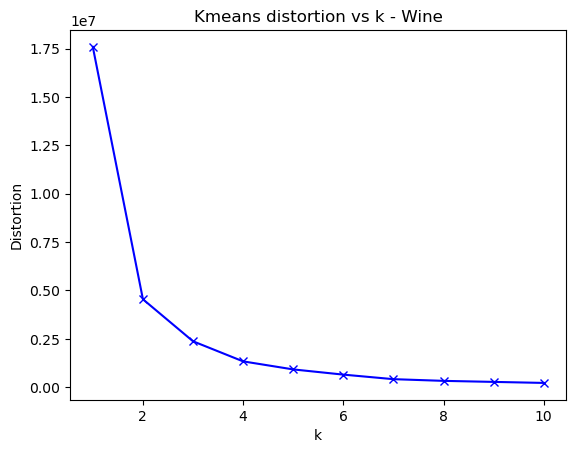

In [14]:
distortions = []
K = range(1, 11)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(X)
    distortions.append(kmeans.inertia_)

# Plot the elbow curve
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('Kmeans distortion vs k - Wine')
plt.show()

In [27]:
#optimal k value is 3
kmeans = KMeans(n_clusters=3, random_state=1714)
kmeans.fit(X)

KMeans(n_clusters=3, random_state=1714)

In [24]:
from sklearn.metrics import silhouette_score, v_measure_score

labels = kmeans.labels_
s_score = silhouette_score(X, labels)
print("Silhouette score:",s_score)
# Calculate the V-score
v_score = v_measure_score(wine.target, labels)

# Print the V-score
print("V-score:", v_score)


Silhouette score: 0.520320647491661
V-score: 0.3391267297949403


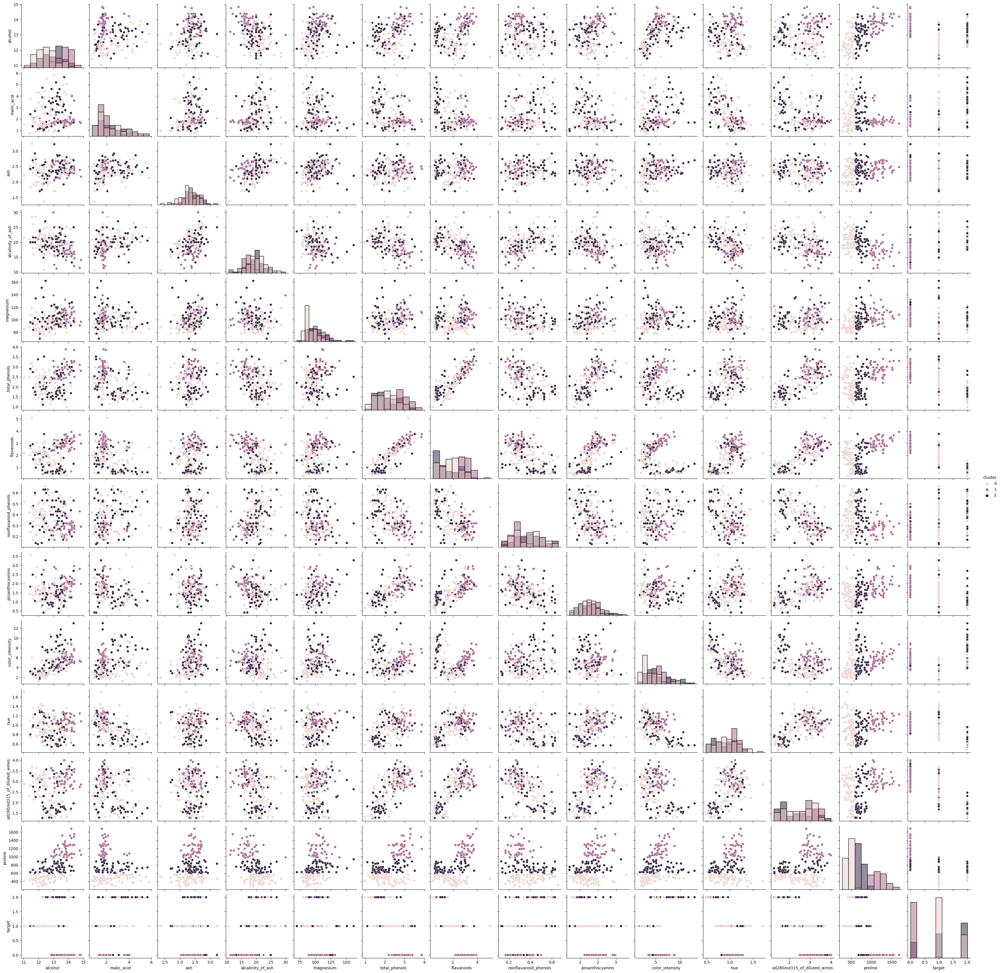

In [9]:
labels = kmeans.fit_predict(X)

# Create a scatter plot of the first two features (alcohol and malic acid), colored by cluster label
df['cluster'] = labels
sns.pairplot(df, hue='cluster', diag_kind='hist')
# plt.scatter(X[:, 0], X[:, 1], c=labels)
# plt.xlabel('Alcohol')
# plt.ylabel('Malic Acid')
# plt.title('K-Means Clustering on Wine Dataset')
plt.show()

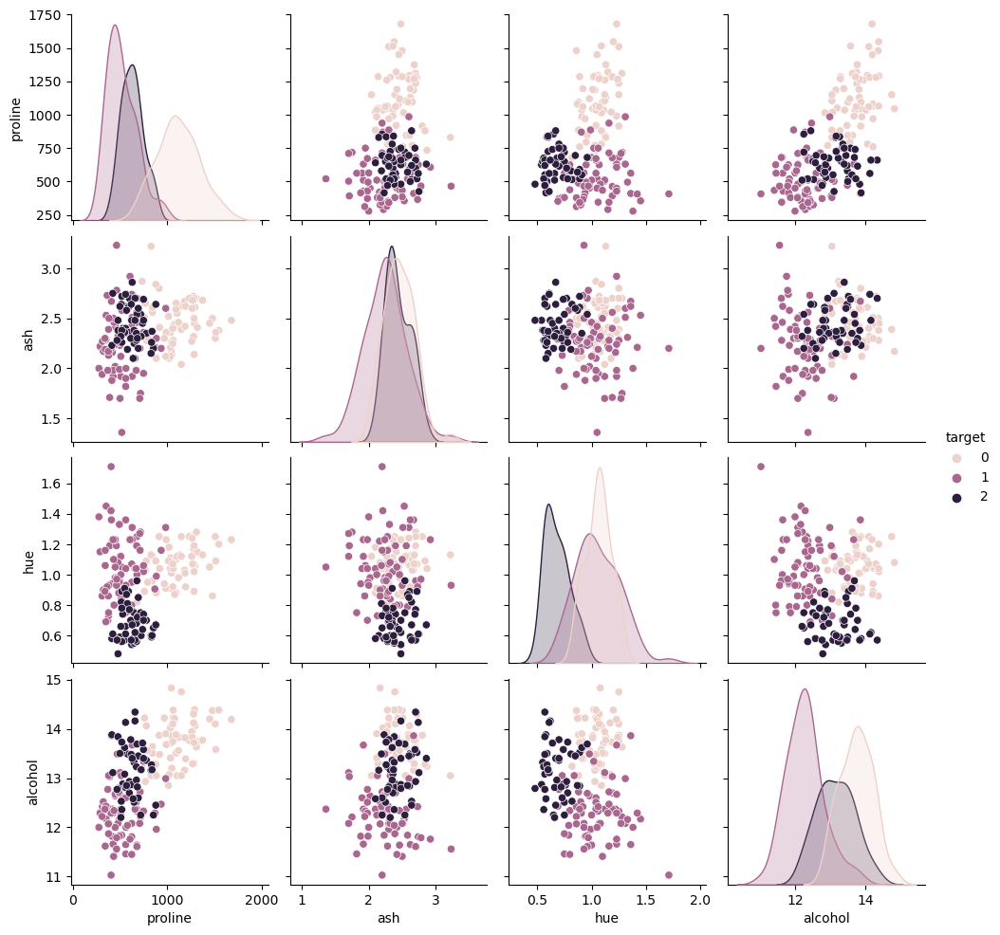

In [19]:
df = pd.DataFrame(X, columns=['proline','ash','hue', 'alcohol'])
df['target'] = wine.target
sns.pairplot(df, hue= 'target')

In [ ]:
df = pd.DataFrame(X, columns=['proline','ash','hue', 'alcohol'])
df['target'] = wine.target
sns.pairplot(df, hue= 'target')

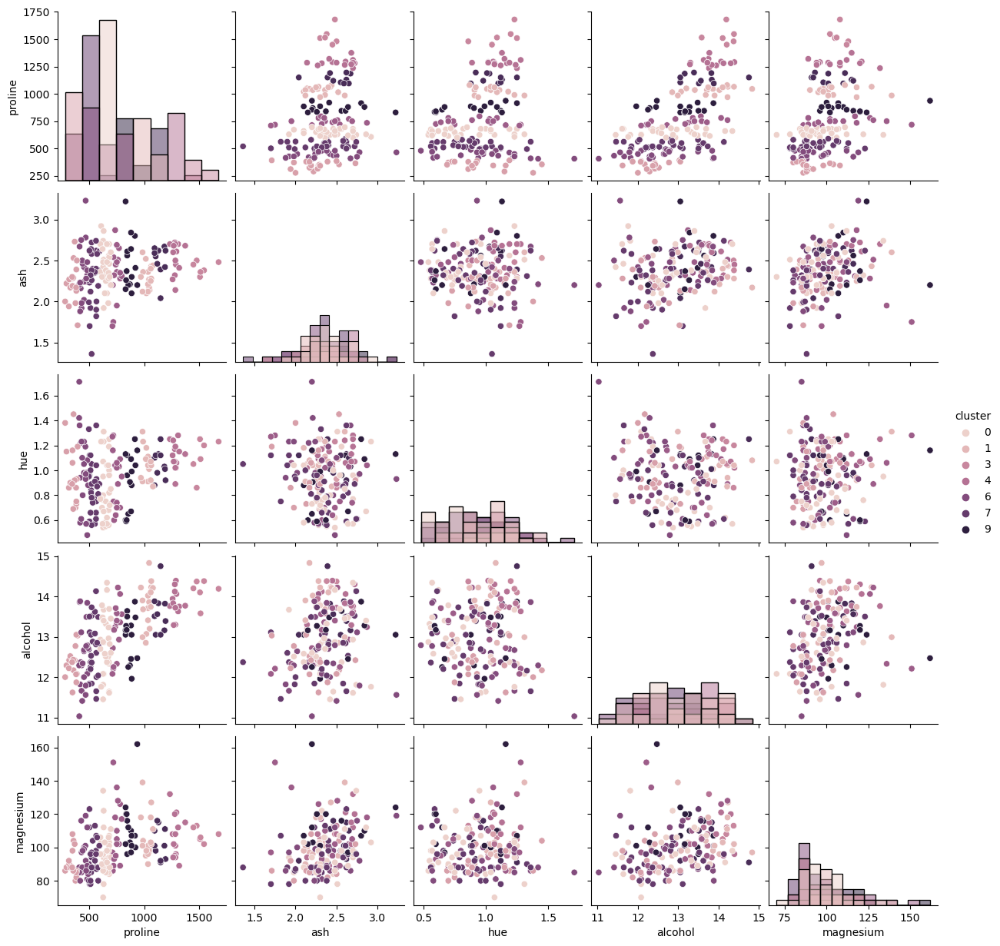

In [30]:
df = pd.DataFrame(X, columns=['proline','ash','hue', 'alcohol', 'magnesium'])
df['cluster'] = labels
sns.pairplot(df, hue='cluster', diag_kind='hist')


In [29]:
cluster_centers = kmeans.cluster_centers_

# Print the mean values for each cluster
for i, center in enumerate(cluster_centers):
    print("Cluster", i+1, ":", center)
print(wine.feature_names)

Cluster 1 : [1.25166667e+01 2.49420290e+00 2.28855072e+00 2.08231884e+01
 9.23478261e+01 2.07072464e+00 1.75840580e+00 3.90144928e-01
 1.45188406e+00 4.08695651e+00 9.41159420e-01 2.49072464e+00
 4.58231884e+02 1.00000000e+00]
Cluster 2 : [1.38044681e+01 1.88340426e+00 2.42617021e+00 1.70234043e+01
 1.05510638e+02 2.86723404e+00 3.01425532e+00 2.85319149e-01
 1.91042553e+00 5.70255319e+00 1.07829787e+00 3.11404255e+00
 1.19514894e+03 3.33066907e-16]
Cluster 3 : [1.29298387e+01 2.50403226e+00 2.40806452e+00 1.98903226e+01
 1.03596774e+02 2.11112903e+00 1.58403226e+00 3.88387097e-01
 1.50338710e+00 5.65032258e+00 8.83967742e-01 2.36548387e+00
 7.28338710e+02 7.09677419e-01]
['alcohol', 'malic_acid', 'ash', 'alcalinity_of_ash', 'magnesium', 'total_phenols', 'flavanoids', 'nonflavanoid_phenols', 'proanthocyanins', 'color_intensity', 'hue', 'od280/od315_of_diluted_wines', 'proline']


In [ ]:
data = load_wine()
true_labels = data.target

# Perform KMeans clustering with 3 clusters
kmeans = KMeans(n_clusters=3, random_state=1714)
predicted_labels = kmeans.fit_predict(data.data)

# Compute the v-score
v_score = v_measure_score(true_labels, predicted_labels)

# Compute the distribution of wine types within each cluster
cluster_labels = pd.Series(predicted_labels)
cluster_labels.index = data.target
counts = pd.crosstab(index=cluster_labels, columns=true_labels)

# Visualize the distribution of wine types within each cluster
counts.plot(kind='bar', stacked=True)

In [37]:
data = load_wine()

# Perform KMeans clustering with 3 clusters
kmeans = KMeans(n_clusters=3, random_state=0)
predicted_labels = kmeans.fit_predict(data.data)

# Compute the mean values of each feature for each cluster
cluster_means = pd.DataFrame(data.data).groupby(predicted_labels).mean()

# Print the feature importance scores
feature_importance = cluster_means.diff().abs().sum(axis=0)
print(feature_importance.sort_values(ascending=False))

12    1203.727279
4       15.076676
3        6.666702
6        2.686073
0        2.162431
9        1.667827
5        1.552614
11       1.371877
1        1.231427
8        0.865580
10       0.331469
7        0.207894
2        0.155725
dtype: float64


Expectation Maximization

In [8]:
# Load the Wine dataset
from sklearn.mixture import GaussianMixture
wine = load_wine()

X = pd.DataFrame(wine.data, columns=wine.feature_names)

gmm = GaussianMixture(n_components=3, random_state=42)
gmm.fit(X)

clusters = gmm.predict(X)

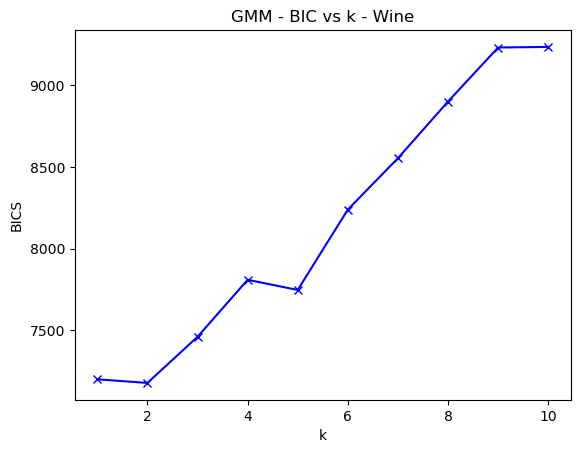

Best n_components: 2


In [39]:
# Range of n_components to try
wine = load_wine()

X = pd.DataFrame(wine.data, columns=wine.feature_names)
n_components_range = range(1, 11)

# Fit GMM for each value of n_components and compute BIC
bics = []
for n_components in n_components_range:
    gmm = GaussianMixture(n_components=n_components, random_state=42)
    gmm.fit(X)
    bics.append(gmm.bic(X))



# Plot the elbow curve
plt.plot(n_components_range, bics, 'bx-')
plt.xlabel('k')
plt.ylabel('BICS')
plt.title('GMM - BIC vs k - Wine')
plt.show()

# Find the best value of n_components
best_n_components = n_components_range[np.argmin(bics)]
print(f"Best n_components: {best_n_components}")

In [14]:
#Best n_components is 2
from sklearn.metrics import silhouette_score, v_measure_score


gmm = GaussianMixture(n_components=2, random_state=2742)
gmm.fit(X)

clusters = gmm.predict(X)

silhouette_avg = silhouette_score(X, clusters)

print(f"Silhouette score: {silhouette_avg}")

Silhouette score: 0.5643242782521396


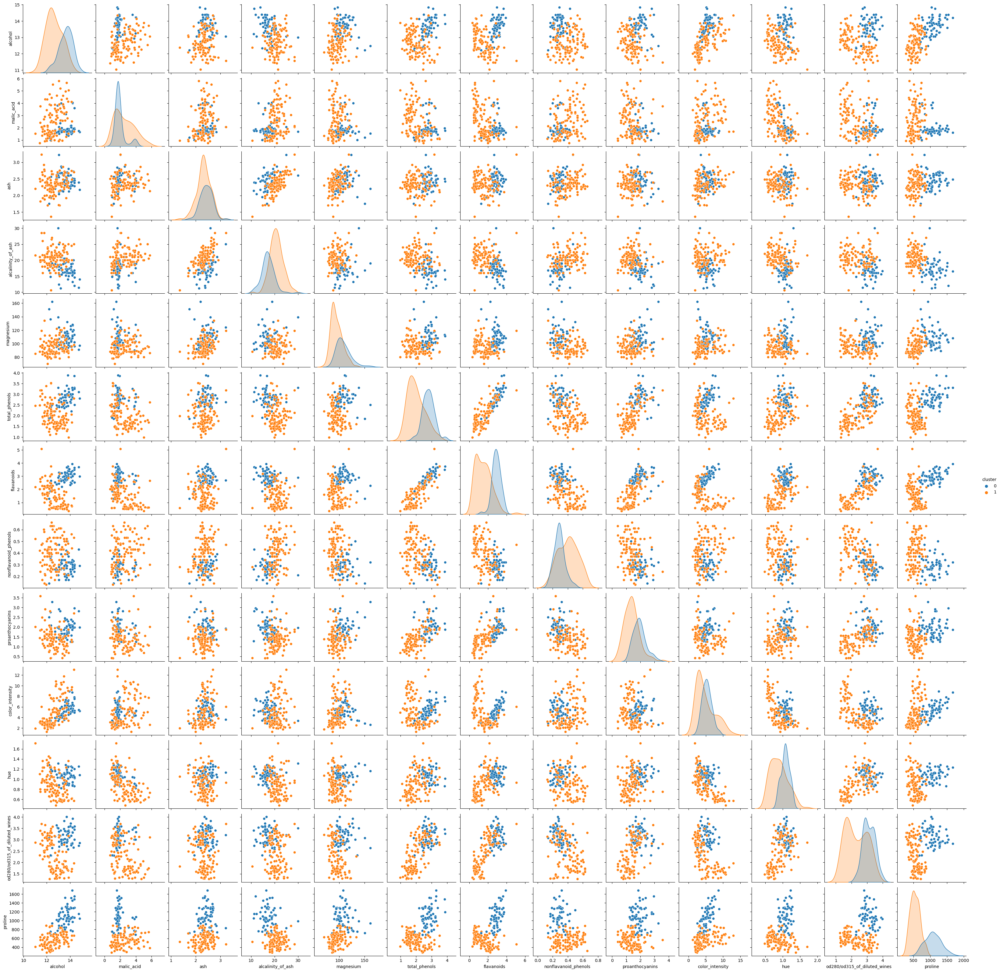

In [11]:
X['cluster'] = clusters
sns.pairplot(X, hue='cluster')

Silhouette score: 0.646147902209561


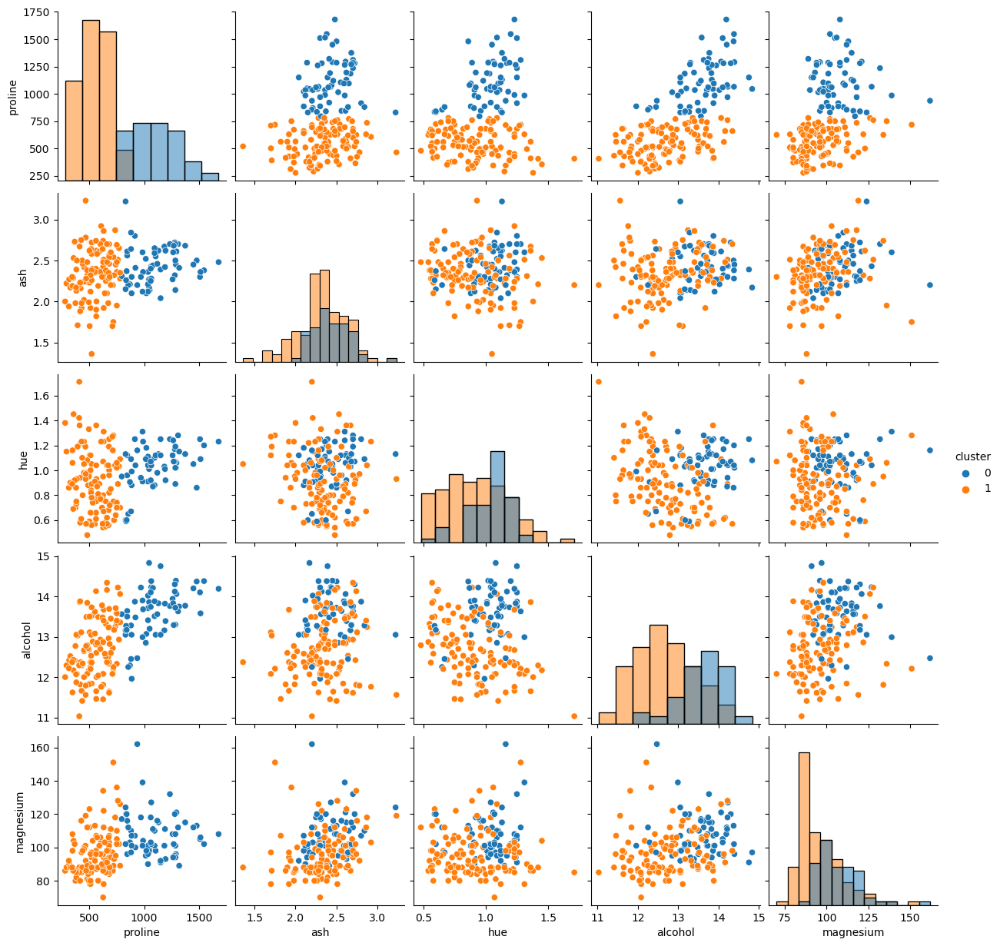

In [3]:
from sklearn.metrics import silhouette_score, v_measure_score


gmm = GaussianMixture(n_components=2, random_state=2742, covariance_type='spherical')
gmm.fit(X)

clusters = gmm.predict(X)

silhouette_avg = silhouette_score(X, clusters)

print(f"Silhouette score: {silhouette_avg}")

df = pd.DataFrame(X, columns=['proline','ash','hue', 'alcohol', 'magnesium'])
df['cluster'] = clusters
sns.pairplot(df, hue='cluster', diag_kind='hist')


Silhouette score: 0.5392313238270554


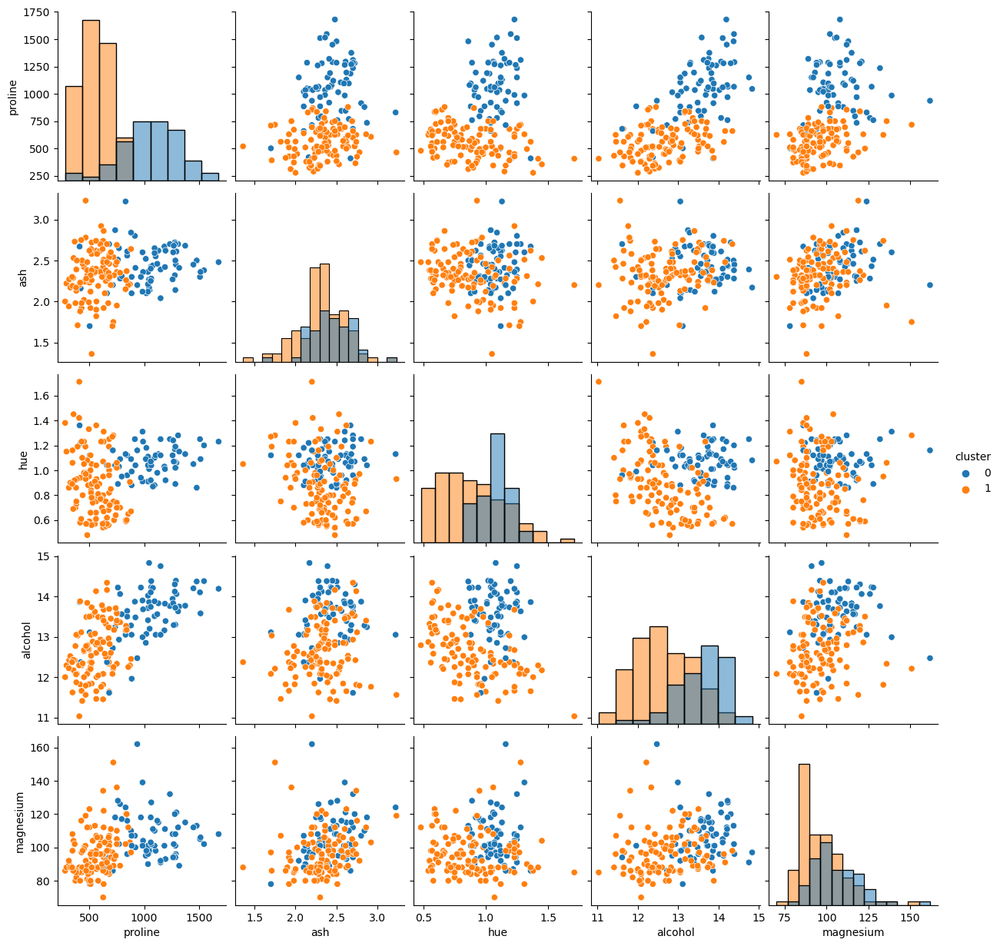

In [4]:
from sklearn.metrics import silhouette_score, v_measure_score


gmm = GaussianMixture(n_components=2, random_state=2742, covariance_type='diag')
gmm.fit(X)

clusters = gmm.predict(X)

silhouette_avg = silhouette_score(X, clusters)

print(f"Silhouette score: {silhouette_avg}")

df = pd.DataFrame(X, columns=['proline','ash','hue', 'alcohol', 'magnesium'])
df['cluster'] = clusters
sns.pairplot(df, hue='cluster', diag_kind='hist')

In [9]:
from sklearn.metrics import silhouette_score, v_measure_score

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(X)


gmm = GaussianMixture(n_components=2, random_state=2742)
gmm.fit(X)

clusters = gmm.predict(X)

silhouette_avg = silhouette_score(X, clusters)

print(f"Silhouette score: {silhouette_avg}")

df = pd.DataFrame(X, columns=['proline','ash','hue', 'alcohol', 'magnesium'])
df['cluster'] = clusters
sns.pairplot(df, hue='cluster', diag_kind='hist')

Silhouette score: 0.25822650257050495


ValueError: Shape of passed values is (178, 13), indices imply (178, 5)

In [32]:
import seaborn as sns
import pandas as pd
from sklearn.datasets import load_wine

# Load wine dataset
data = load_wine()
wine_data = data.data
X= wine_data
feature_names = data.feature_names

# Fit the GMM model to the wine dataset
gmm = GaussianMixture(n_components=3, random_state=0)
gmm.fit(wine_data)

# Predict the cluster membership for each wine
df = pd.DataFrame(X, columns=['proline','ash','hue', 'alcohol', 'magnesium'])
clusters = gmm.predict(wine_data)
df['cluster'] = clusters

# Add the cluster membership to the wine dataset

wine_data['cluster'] = clusters

# Plot a scatterplot or density plot of two features
sns.scatterplot(x='alcohol', y='malic_acid', hue='cluster', data=wine_data)
sns.kdeplot(x='alcohol', y='malic_acid', hue='cluster', data=wine_data)

ValueError: Shape of passed values is (178, 13), indices imply (178, 5)